# **1- Go to project folder**

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

%cd '/content/drive/MyDrive/AI-Smart Hub/Mahmoud Ahmed Shawqi/CV_project/1/'


Mounted at /content/drive
/content/drive/MyDrive/AI-Smart Hub/Mahmoud Ahmed Shawqi/CV_project/1


In [ ]:
!pip install gdown

In [ ]:
!gdown --id 1iwAeG9J8Uklq2jNRcrqlnRq32_L30Kyz

/opt/conda/lib/python3.10/site-packages/gdown/__main__.py:140: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From (original): https://drive.google.com/uc?id=1iwAeG9J8Uklq2jNRcrqlnRq32_L30Kyz
From (redirected): https://drive.google.com/uc?id=1iwAeG9J8Uklq2jNRcrqlnRq32_L30Kyz&confirm=t&uuid=eab92238-0874-4d10-96a3-7cc97e72f36b
To: /kaggle/working/RetinalSegmentation.zip
100%|████████████████████████████████████████| 289M/289M [00:04<00:00, 67.3MB/s]


In [ ]:
ls

RetinalSegmentation.zip


In [ ]:
!unzip -q RetinalSegmentation.zip

In [ ]:
ls

RetinalSegmentation.zip  mask/  retina/


In [ ]:
import os

project_folder_path = '/content/drive/MyDrive/AI-Smart Hub/Mahmoud Ahmed Shawqi/CV_project/1/'

data_labels = os.listdir(project_folder_path)

print("Files in the shared folder:")
for file in data_labels:
    print(file)

data_path = os.path.join(project_folder_path, 'retina/')
label_path = os.path.join(project_folder_path, 'mask/')


Files in the shared folder:
retina
mask
model_1.h5
model_4.h5
cv-project-1.ipynb


In [ ]:
data_imgs = os.listdir(data_path)
label_imgs = os.listdir(label_path)

# **2- Import Libraries**

In [ ]:
import cv2
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.model_selection import train_test_split
import numpy as np
import os
import cv2
import glob
import matplotlib.pyplot as plt

# **3- Show example from data**

In [ ]:
example = cv2.imread(label_path+label_imgs[1])

In [ ]:
example.shape

(512, 512, 3)

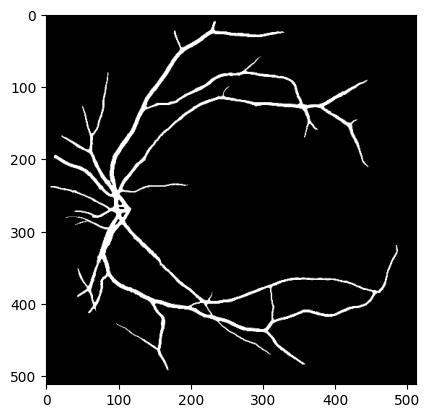

In [ ]:
plt.imshow(example)

In [ ]:
example.shape[:2]

(512, 512)

# **4- Initialize image files and mask files**

In [ ]:
image_files = sorted(glob.glob(os.path.join(data_path, '*.png')))
mask_files = sorted(glob.glob(os.path.join(label_path, '*.png')))

# **5- Create Suitable Data Generator Class**

In [ ]:
class DataGenerator(tf.keras.utils.Sequence):
    def __init__(self, image_files, mask_files, batch_size=16, image_size=example.shape[:2], shuffle=True):
        self.image_files = image_files
        self.mask_files = mask_files
        self.batch_size = batch_size
        self.image_size = image_size
        self.shuffle = shuffle
        self.on_epoch_end()

    def __len__(self):
        return len(self.image_files) // self.batch_size

    def __getitem__(self, index):
        batch_image_files = self.image_files[index*self.batch_size:(index+1)*self.batch_size]
        batch_mask_files = self.mask_files[index*self.batch_size:(index+1)*self.batch_size]

        images, masks = self.__data_generation(batch_image_files, batch_mask_files)

        return images, masks

    def on_epoch_end(self):
        if self.shuffle:
            combined = list(zip(self.image_files, self.mask_files))
            np.random.shuffle(combined)
            self.image_files, self.mask_files = zip(*combined)

    def __data_generation(self, batch_image_files, batch_mask_files):
        images = []
        masks = []

        for img_path, mask_path in zip(batch_image_files, batch_mask_files):
            image = cv2.imread(img_path)
            image = cv2.resize(image, self.image_size)
            image = image / 255.0

            mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
            mask = cv2.resize(mask, self.image_size)
            mask = mask / 255.0
            mask = np.expand_dims(mask, axis=-1)

            images.append(image)
            masks.append(mask)

        return np.array(images), np.array(masks)


# **6- Train Test Split**

In [ ]:
image_files_train, image_files_val, mask_files_train, mask_files_val = train_test_split(image_files, mask_files, test_size=0.2, random_state=42)

In [ ]:
image_files_train[:5]

['/content/drive/MyDrive/AI-Smart Hub/Mahmoud Ahmed Shawqi/CV_project/1/retina/853.png',
 '/content/drive/MyDrive/AI-Smart Hub/Mahmoud Ahmed Shawqi/CV_project/1/retina/965.png',
 '/content/drive/MyDrive/AI-Smart Hub/Mahmoud Ahmed Shawqi/CV_project/1/retina/385.png',
 '/content/drive/MyDrive/AI-Smart Hub/Mahmoud Ahmed Shawqi/CV_project/1/retina/429.png',
 '/content/drive/MyDrive/AI-Smart Hub/Mahmoud Ahmed Shawqi/CV_project/1/retina/739.png']

In [ ]:
mask_files_train[:5]

['/content/drive/MyDrive/AI-Smart Hub/Mahmoud Ahmed Shawqi/CV_project/1/mask/853.png',
 '/content/drive/MyDrive/AI-Smart Hub/Mahmoud Ahmed Shawqi/CV_project/1/mask/965.png',
 '/content/drive/MyDrive/AI-Smart Hub/Mahmoud Ahmed Shawqi/CV_project/1/mask/385.png',
 '/content/drive/MyDrive/AI-Smart Hub/Mahmoud Ahmed Shawqi/CV_project/1/mask/429.png',
 '/content/drive/MyDrive/AI-Smart Hub/Mahmoud Ahmed Shawqi/CV_project/1/mask/739.png']

# **7- Create generator objects for both training and validating data**

In [ ]:
batch_size = 16
image_size = example.shape[:2]

train_generator = DataGenerator(image_files_train, mask_files_train, batch_size=batch_size, image_size=image_size)
val_generator = DataGenerator(image_files_val, mask_files_val, batch_size=batch_size, image_size=image_size, shuffle=False)


# **8- Create U-Net model**

# `U-Net Model`

In [ ]:
def unet_model(input_shape):
    inputs = tf.keras.layers.Input(input_shape)

    # Encoder
    c1 = tf.keras.layers.Conv2D(16, (3, 3), activation='relu', padding='same')(inputs)
    c1 = tf.keras.layers.Conv2D(16, (3, 3), activation='relu', padding='same')(c1)
    p1 = tf.keras.layers.MaxPooling2D((2, 2))(c1)

    c2 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', padding='same')(p1)
    c2 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', padding='same')(c2)
    p2 = tf.keras.layers.MaxPooling2D((2, 2))(c2)

    c3 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', padding='same')(p2)
    c3 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', padding='same')(c3)
    p3 = tf.keras.layers.MaxPooling2D((2, 2))(c3)

    c4 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', padding='same')(p3)
    c4 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', padding='same')(c4)
    p4 = tf.keras.layers.MaxPooling2D((2, 2))(c4)

    # Bottleneck
    c5 = tf.keras.layers.Conv2D(256, (3, 3), activation='relu', padding='same')(p4)
    c5 = tf.keras.layers.Conv2D(256, (3, 3), activation='relu', padding='same')(c5)

    # Decoder
    u6 = tf.keras.layers.Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same')(c5)
    u6 = tf.keras.layers.concatenate([u6, c4])  # First skip connection
    c6 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', padding='same')(u6)
    c6 = tf.keras.layers.Conv2D(128, (3, 3), activation='relu', padding='same')(c6)

    u7 = tf.keras.layers.Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same')(c6)
    u7 = tf.keras.layers.concatenate([u7, c3])  # 2nd Skip connection
    c7 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', padding='same')(u7)
    c7 = tf.keras.layers.Conv2D(64, (3, 3), activation='relu', padding='same')(c7)

    u8 = tf.keras.layers.Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same')(c7)
    u8 = tf.keras.layers.concatenate([u8, c2])  # 3rd Skip connection
    c8 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', padding='same')(u8)
    c8 = tf.keras.layers.Conv2D(32, (3, 3), activation='relu', padding='same')(c8)

    u9 = tf.keras.layers.Conv2DTranspose(16, (2, 2), strides=(2, 2), padding='same')(c8)
    u9 = tf.keras.layers.concatenate([u9, c1])  # 4th Skip connection
    c9 = tf.keras.layers.Conv2D(16, (3, 3), activation='relu', padding='same')(u9)
    c9 = tf.keras.layers.Conv2D(16, (3, 3), activation='relu', padding='same')(c9)

    outputs = tf.keras.layers.Conv2D(1, (1, 1), activation='sigmoid')(c9)

    model = tf.keras.Model(inputs=[inputs], outputs=[outputs])
    return model

input_shape = (image_size[0], image_size[1], 3)
model = unet_model(input_shape)

model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

model.summary()


Model: "model"

__________________________________________________________________________________________________

 Layer (type)                Output Shape                 Param #   Connected to                  


 input_1 (InputLayer)        [(None, 512, 512, 3)]        0         []                            

                                                                                                  

 conv2d (Conv2D)             (None, 512, 512, 16)         448       ['input_1[0][0]']             

                                                                                                  

 conv2d_1 (Conv2D)           (None, 512, 512, 16)         2320      ['conv2d[0][0]']              

                                                                                                  

 max_pooling2d (MaxPooling2  (None, 256, 256, 16)         0         ['conv2d_1[0][0]']            

 D)                                                                                

# **9- Run model and fit**

In [ ]:
history = model.fit(train_generator,
                    validation_data=val_generator,
                    validation_steps=1,
                    epochs=20,
                    verbose=1)


Epoch 1/20

26/26 [==============================] - 1049s 39s/step - loss: 0.4151 - accuracy: 0.9195 - val_loss: 0.2444 - val_accuracy: 0.9132

Epoch 2/20

26/26 [==============================] - 41s 2s/step - loss: 0.2314 - accuracy: 0.9201 - val_loss: 0.2386 - val_accuracy: 0.9132

Epoch 3/20

26/26 [==============================] - 34s 1s/step - loss: 0.2283 - accuracy: 0.9204 - val_loss: 0.2367 - val_accuracy: 0.9132

Epoch 4/20

26/26 [==============================] - 33s 1s/step - loss: 0.2272 - accuracy: 0.9201 - val_loss: 0.2332 - val_accuracy: 0.9132

Epoch 5/20

26/26 [==============================] - 33s 1s/step - loss: 0.2234 - accuracy: 0.9203 - val_loss: 0.2314 - val_accuracy: 0.9132

Epoch 6/20

26/26 [==============================] - 32s 1s/step - loss: 0.2174 - accuracy: 0.9201 - val_loss: 0.2228 - val_accuracy: 0.9132

Epoch 7/20

26/26 [==============================] - 35s 1s/step - loss: 0.2010 - accuracy: 0.9204 - val_loss: 0.1867 - val_accuracy: 0.9132

Epo

# **10- Evaluating**

In [ ]:
loss, accuracy = model.evaluate(val_generator)
print(f'Test loss: {loss}')
print(f'Test accuracy: {accuracy}')


6/6 [==============================] - 181s 36s/step - loss: 0.1054 - accuracy: 0.9511

Test loss: 0.10536450147628784

Test accuracy: 0.9510559439659119


In [ ]:
def metrics_plot(model_name):
  acc = model_name.history['accuracy']
  val_acc = model_name.history['val_accuracy']
  loss = model_name.history['loss']
  val_loss = model_name.history['val_loss']

  epochs = range(len(acc))

  plt.plot(epochs, acc, 'b', label='Training acc')
  plt.plot(epochs, val_acc, 'r', label='Validation acc')
  plt.title('Training and validation accuracy')

  plt.legend()

  plt.figure()

  plt.plot(epochs, loss, 'b', label='Training loss')
  plt.plot(epochs, val_loss, 'r', label='Validation loss')
  plt.title('Training and validation loss')
  plt.legend()

  plt.show()

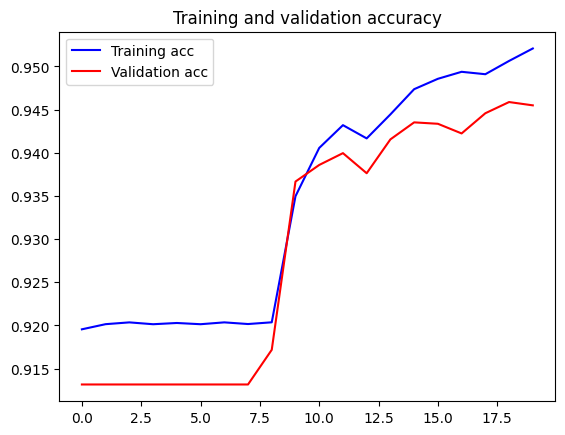

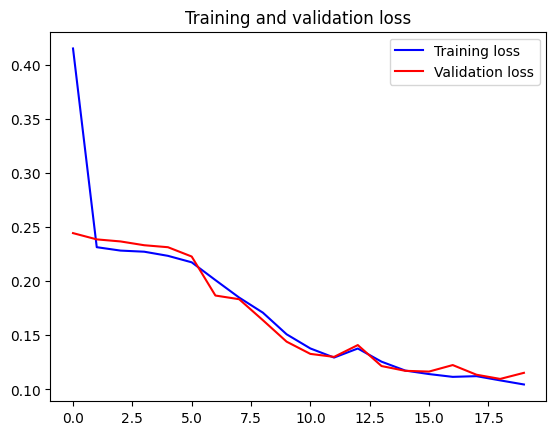

In [ ]:
metrics_plot(history)

In [ ]:
predictions = model.predict(val_generator)

# Load an example batch for visualization
images, masks = next(iter(val_generator))
preds = model.predict(images)


6/6 [==============================] - 6s 1s/step

1/1 [==============================] - 0s 114ms/step


# **11- Visual Evaluating**

In [ ]:
# # Display the first image, true mask, and predicted mask
for index in range(15):
  plt.figure(figsize=(12, 6))

  plt.subplot(1, 3, 1)
  plt.title('Image')
  plt.imshow(images[index])

  plt.subplot(1, 3, 2)
  plt.title('True Mask')
  plt.imshow(masks[index].squeeze(), cmap='gray')

  plt.subplot(1, 3, 3)
  plt.title('Predicted Mask')
  plt.imshow(preds[index].squeeze(), cmap='gray')

  plt.show()

# **12- Run more 20 Epochs for enhancment**

In [ ]:
history_2 = model.fit(train_generator,
                    validation_data=val_generator,
                    validation_steps=1,
                    epochs=20,
                    verbose=1)

Epoch 1/20

26/26 [==============================] - 36s 1s/step - loss: 0.1041 - accuracy: 0.9523 - val_loss: 0.1089 - val_accuracy: 0.9468

Epoch 2/20

26/26 [==============================] - 35s 1s/step - loss: 0.1011 - accuracy: 0.9536 - val_loss: 0.1063 - val_accuracy: 0.9481

Epoch 3/20

26/26 [==============================] - 38s 1s/step - loss: 0.1017 - accuracy: 0.9532 - val_loss: 0.1073 - val_accuracy: 0.9468

Epoch 4/20

26/26 [==============================] - 36s 1s/step - loss: 0.0996 - accuracy: 0.9541 - val_loss: 0.1008 - val_accuracy: 0.9493

Epoch 5/20

26/26 [==============================] - 33s 1s/step - loss: 0.0956 - accuracy: 0.9555 - val_loss: 0.0987 - val_accuracy: 0.9504

Epoch 6/20

26/26 [==============================] - 38s 1s/step - loss: 0.0973 - accuracy: 0.9549 - val_loss: 0.1032 - val_accuracy: 0.9489

Epoch 7/20

26/26 [==============================] - 35s 1s/step - loss: 0.0940 - accuracy: 0.9562 - val_loss: 0.0995 - val_accuracy: 0.9498

Epoch 

# **13- Re Evaluating**

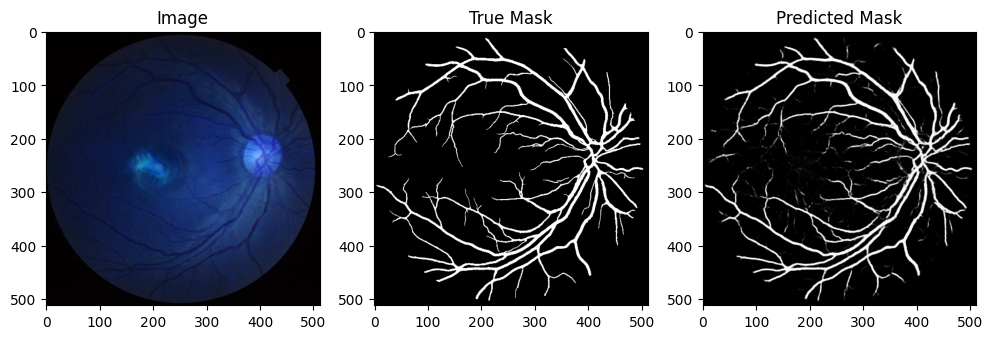

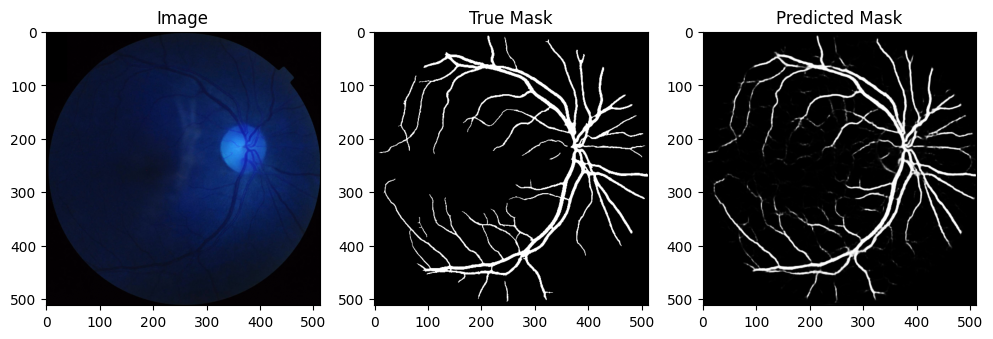

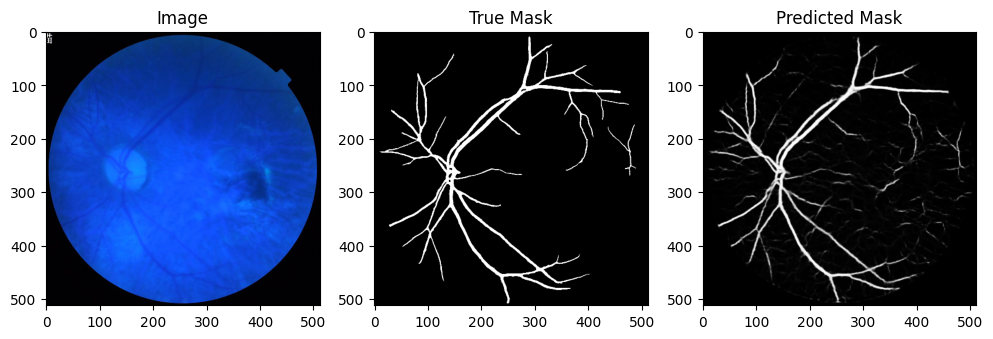

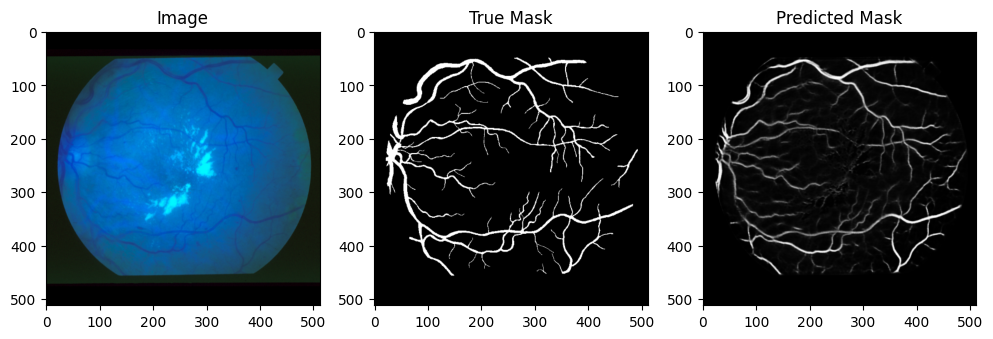

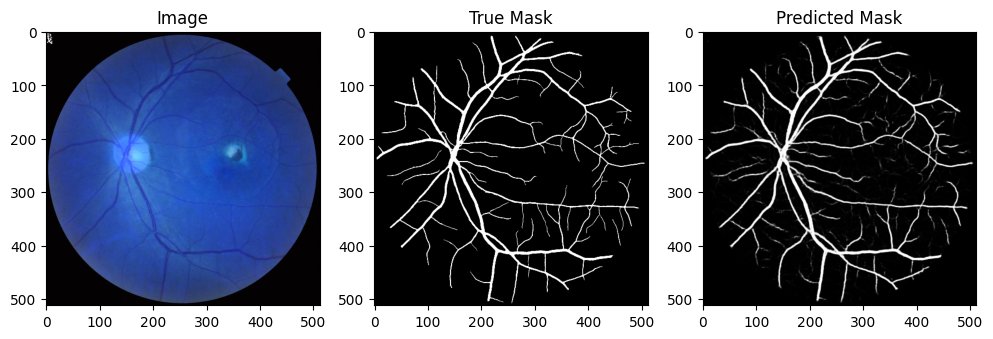

...

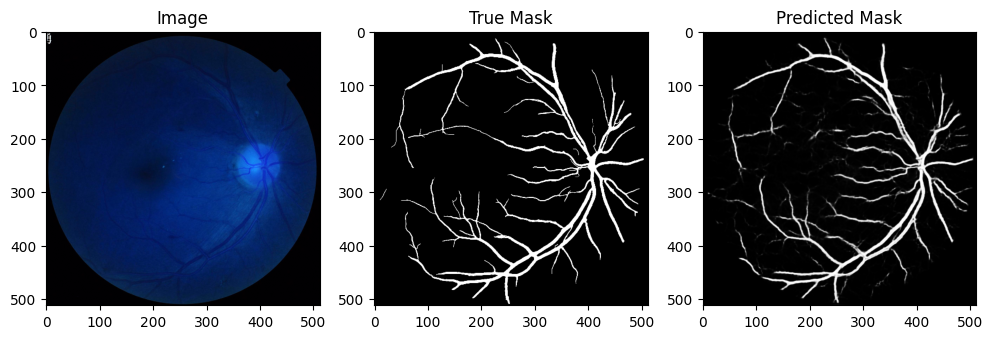

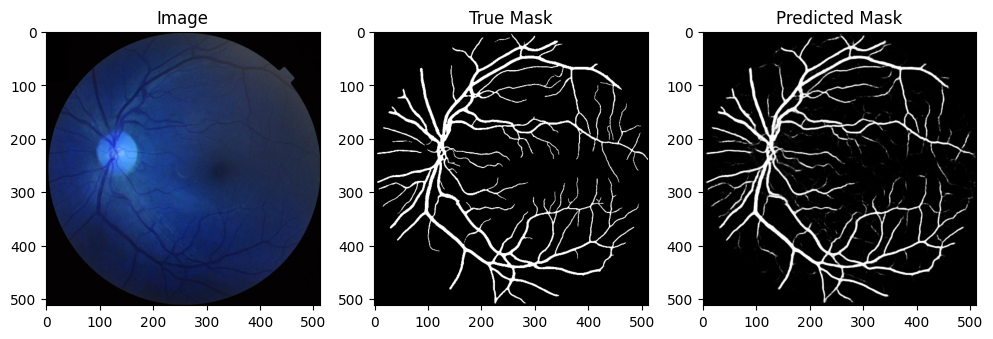

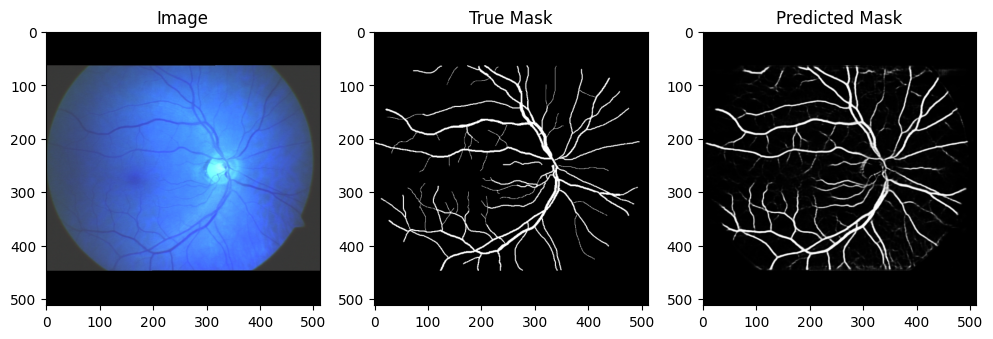

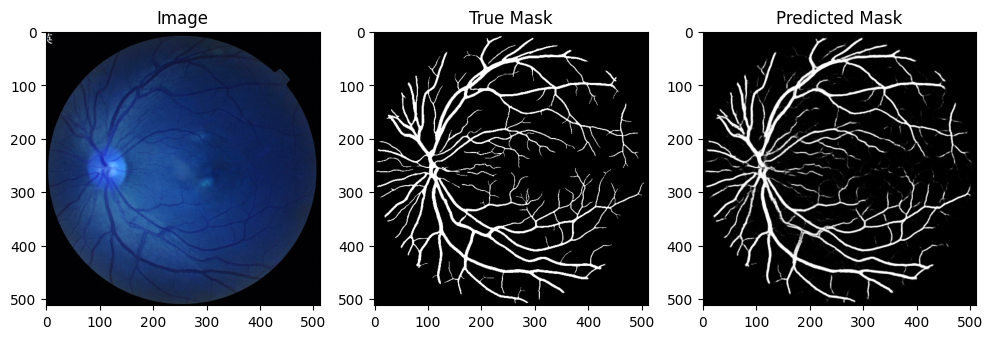

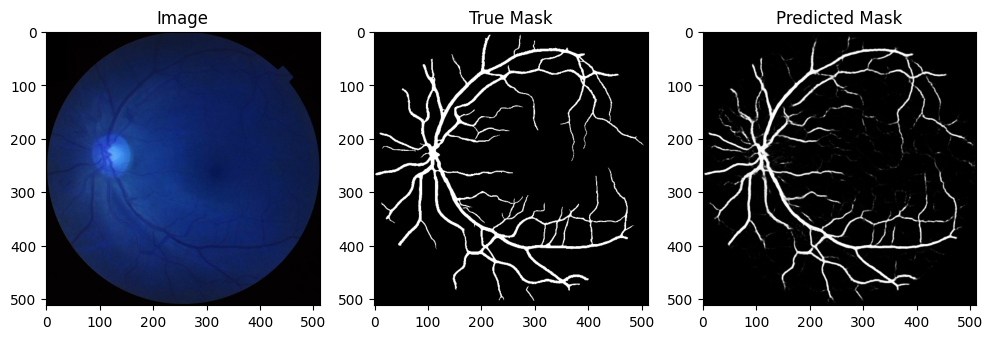

In [ ]:
predictions = model.predict(val_generator)

images, masks = next(iter(val_generator))
preds = model.predict(images)

for index in range(15):
  plt.figure(figsize=(12, 6))

  plt.subplot(1, 3, 1)
  plt.title('Image')
  plt.imshow(images[index])

  plt.subplot(1, 3, 2)
  plt.title('True Mask')
  plt.imshow(masks[index].squeeze(), cmap='gray')

  plt.subplot(1, 3, 3)
  plt.title('Predicted Mask')
  plt.imshow(preds[index].squeeze(), cmap='gray')

  plt.show()


# **14- Save model, Satisfying Results ❤️**

In [ ]:
model_path = project_folder_path + 'model_1.h5'

# Save the model
model.save(model_path)

print("Model saved successfully.")


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.

  saving_api.save_model(


Model saved successfully.


In [ ]:
# Load the model

loaded_model_U_NET = tf.keras.models.load_model("model_1.h5")


In [ ]:
loaded_model_U_NET.fit(train_generator,
                    validation_data=val_generator,
                    validation_steps=1,
                    epochs=20,
                    verbose=1)

Epoch 1/20
52/52 [==============================] - 48s 565ms/step - loss: 0.0732 - accuracy: 0.9640 - val_loss: 0.0691 - val_accuracy: 0.9624
Epoch 2/20
52/52 [==============================] - 30s 577ms/step - loss: 0.0736 - accuracy: 0.9640 - val_loss: 0.0736 - val_accuracy: 0.9607
Epoch 3/20
52/52 [==============================] - 31s 582ms/step - loss: 0.0749 - accuracy: 0.9634 - val_loss: 0.0696 - val_accuracy: 0.9628
Epoch 4/20
52/52 [==============================] - 32s 604ms/step - loss: 0.0713 - accuracy: 0.9647 - val_loss: 0.0699 - val_accuracy: 0.9621
Epoch 5/20
52/52 [==============================] - 31s 592ms/step - loss: 0.0700 - accuracy: 0.9650 - val_loss: 0.0683 - val_accuracy: 0.9631
Epoch 6/20
52/52 [==============================] - 31s 597ms/step - loss: 0.0692 - accuracy: 0.9652 - val_loss: 0.0661 - val_accuracy: 0.9640
Epoch 7/20
52/52 [==============================] - 30s 578ms/step - loss: 0.0673 - accuracy: 0.9659 - val_loss: 0.0617 - val_accuracy: 0.9652

1/1 [==============================] - 0s 293ms/step


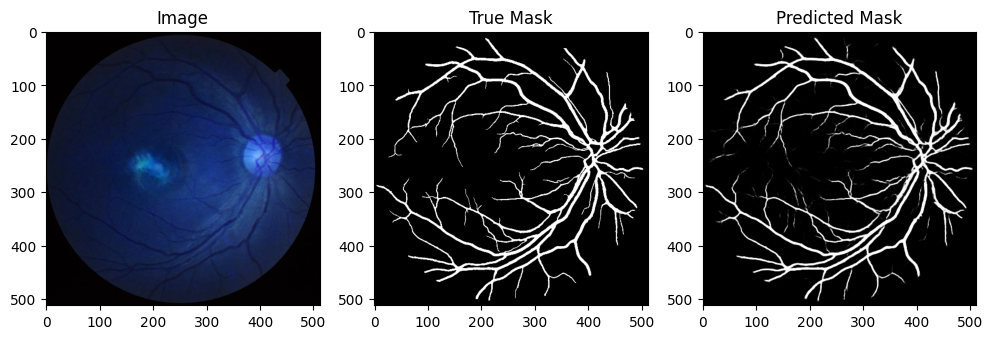

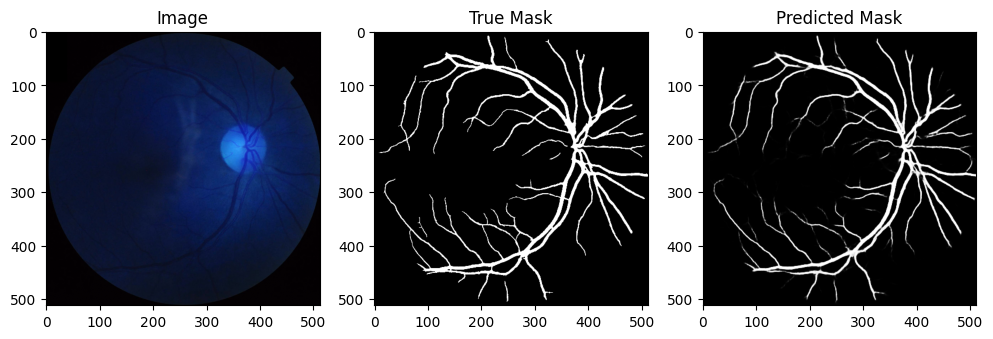

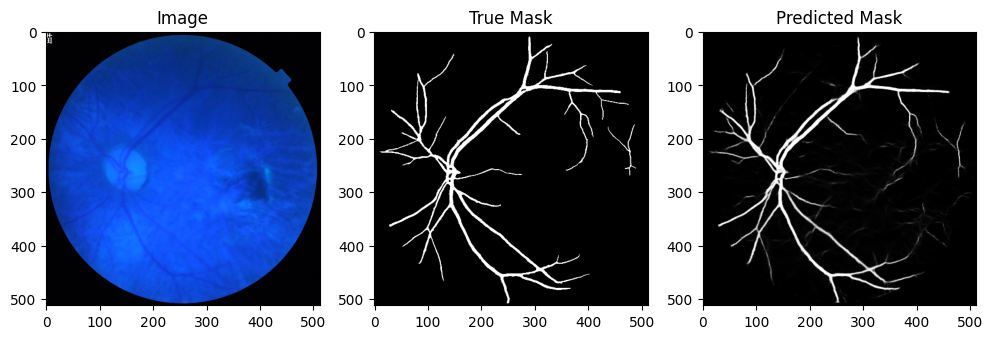

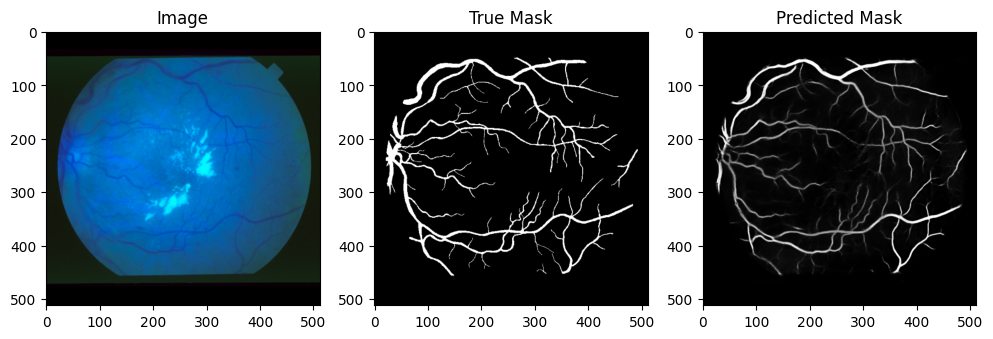

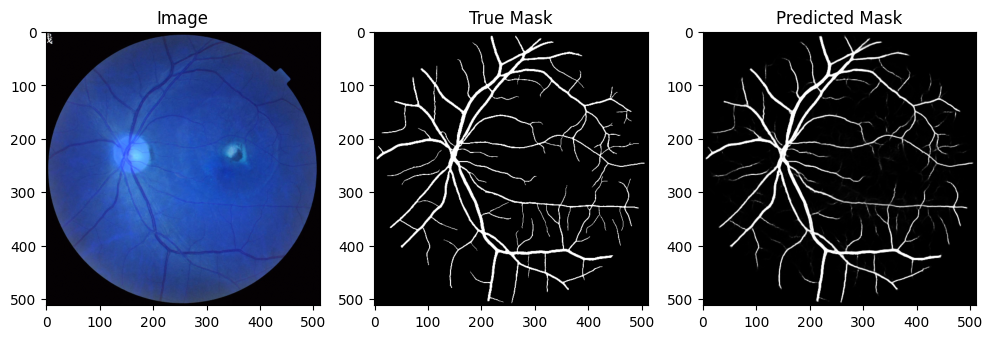

...

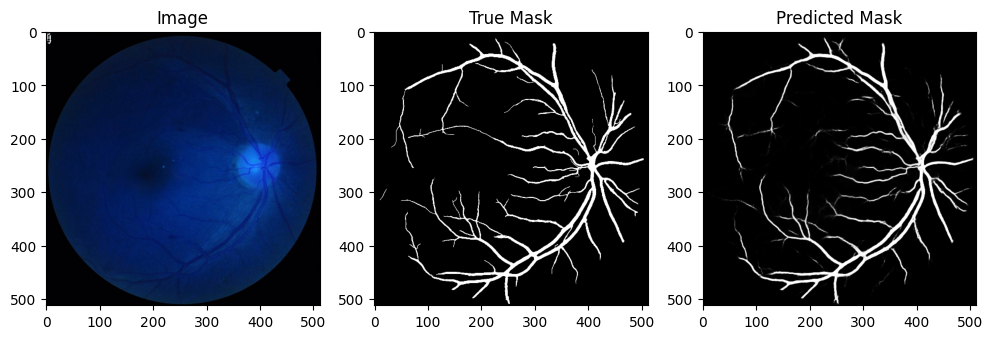

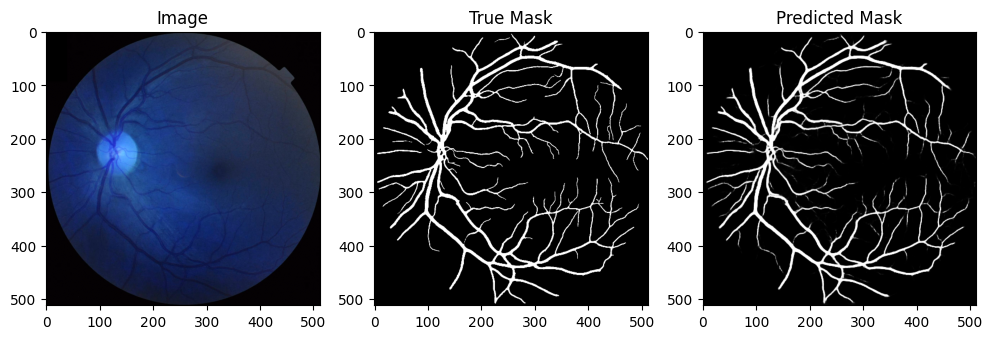

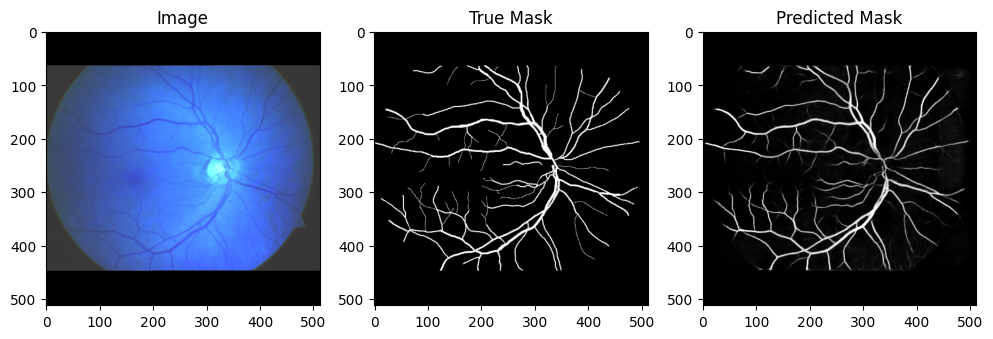

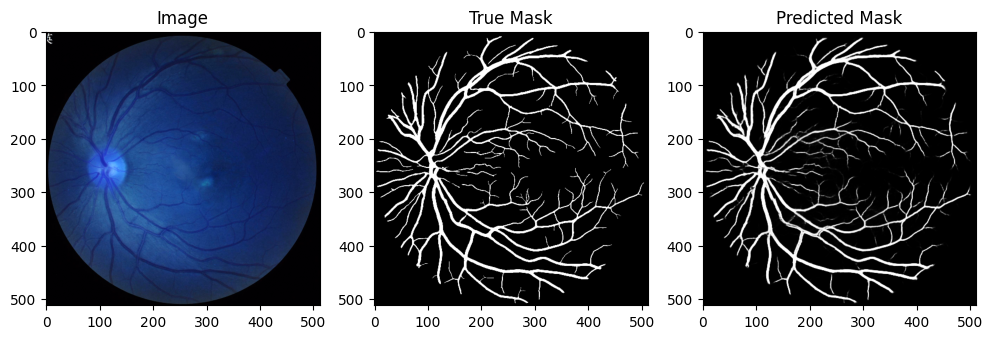

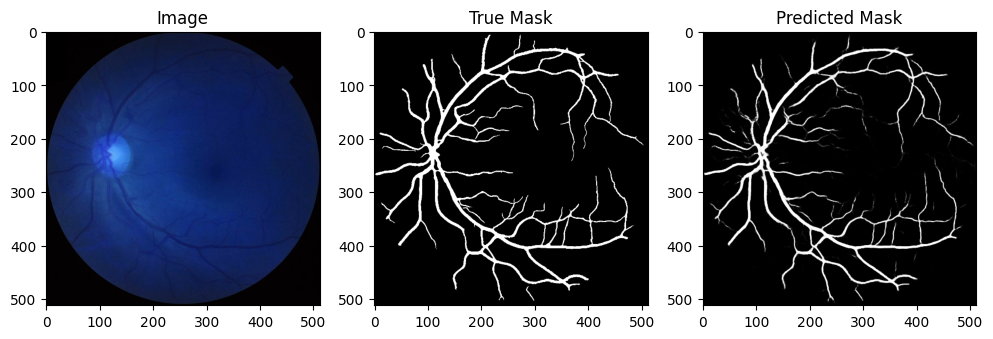

In [ ]:
predictions = loaded_model_U_NET.predict(val_generator)

images, masks = next(iter(val_generator))
preds = loaded_model_U_NET.predict(images)

for index in range(15):
  plt.figure(figsize=(12, 6))

  plt.subplot(1, 3, 1)
  plt.title('Image')
  plt.imshow(images[index])

  plt.subplot(1, 3, 2)
  plt.title('True Mask')
  plt.imshow(masks[index].squeeze(), cmap='gray')

  plt.subplot(1, 3, 3)
  plt.title('Predicted Mask')
  plt.imshow(preds[index].squeeze(), cmap='gray')

  plt.show()


In [ ]:
loaded_model_U_NET.save('Fine_tuned_U_NET_Model.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
loaded_model_U_NET.save('Fine_tuned_U_NET_Model.keras')

In [ ]:
# loss, accuracy = loaded_model.evaluate(val_generator)
# print(f'Test loss: {loss}')
# print(f'Test accuracy: {accuracy}')

13/13 [==============================] - 185s 14s/step - loss: 0.0683 - accuracy: 0.9649

Test loss: 0.06826767325401306

Test accuracy: 0.964867353439331


In [ ]:
loaded_model_U_NET = tf.keras.models.load_model("Fine_tuned_U_NET_Model.keras")


# **`SegNet`**

In [ ]:
import tensorflow as tf
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, BatchNormalization

def segnet(input_shape=(512, 512, 3), n_classes=1):
    inputs = Input(shape=input_shape)

    # Encoder
    conv1 = Conv2D(16, (3, 3), activation='relu', padding='same')(inputs)
    conv1 = BatchNormalization()(conv1)
    conv1 = Conv2D(16, (3, 3), activation='relu', padding='same')(conv1)
    conv1 = BatchNormalization()(conv1)
    pool1 = MaxPooling2D((2, 2), strides=(2, 2))(conv1)

    conv2 = Conv2D(32, (3, 3), activation='relu', padding='same')(pool1)
    conv2 = BatchNormalization()(conv2)
    conv2 = Conv2D(32, (3, 3), activation='relu', padding='same')(conv2)
    conv2 = BatchNormalization()(conv2)
    pool2 = MaxPooling2D((2, 2), strides=(2, 2))(conv2)

    conv3 = Conv2D(64, (3, 3), activation='relu', padding='same')(pool2)
    conv3 = BatchNormalization()(conv3)
    conv3 = Conv2D(64, (3, 3), activation='relu', padding='same')(conv3)
    conv3 = BatchNormalization()(conv3)
    conv3 = Conv2D(64, (3, 3), activation='relu', padding='same')(conv3)
    conv3 = BatchNormalization()(conv3)
    pool3 = MaxPooling2D((2, 2), strides=(2, 2))(conv3)

    conv4 = Conv2D(128, (3, 3), activation='relu', padding='same')(pool3)
    conv4 = BatchNormalization()(conv4)
    conv4 = Conv2D(128, (3, 3), activation='relu', padding='same')(conv4)
    conv4 = BatchNormalization()(conv4)
    conv4 = Conv2D(128, (3, 3), activation='relu', padding='same')(conv4)
    conv4 = BatchNormalization()(conv4)
    pool4 = MaxPooling2D((2, 2), strides=(2, 2))(conv4)

    conv5 = Conv2D(128, (3, 3), activation='relu', padding='same')(pool4)
    conv5 = BatchNormalization()(conv5)
    conv5 = Conv2D(128, (3, 3), activation='relu', padding='same')(conv5)
    conv5 = BatchNormalization()(conv5)
    conv5 = Conv2D(128, (3, 3), activation='relu', padding='same')(conv5)
    conv5 = BatchNormalization()(conv5)
    pool5 = MaxPooling2D((2, 2), strides=(2, 2))(conv5)

    # Decoder
    up6 = UpSampling2D((2, 2))(pool5)
    up6 = Conv2D(128, (3, 3), activation='relu', padding='same')(up6)
    up6 = BatchNormalization()(up6)
    up6 = Conv2D(128, (3, 3), activation='relu', padding='same')(up6)
    up6 = BatchNormalization()(up6)
    up6 = Conv2D(128, (3, 3), activation='relu', padding='same')(up6)
    up6 = BatchNormalization()(up6)

    up7 = UpSampling2D((2, 2))(up6)
    up7 = Conv2D(128, (3, 3), activation='relu', padding='same')(up7)
    up7 = BatchNormalization()(up7)
    up7 = Conv2D(128, (3, 3), activation='relu', padding='same')(up7)
    up7 = BatchNormalization()(up7)
    up7 = Conv2D(64, (3, 3), activation='relu', padding='same')(up7)
    up7 = BatchNormalization()(up7)

    up8 = UpSampling2D((2, 2))(up7)
    up8 = Conv2D(64, (3, 3), activation='relu', padding='same')(up8)
    up8 = BatchNormalization()(up8)
    up8 = Conv2D(64, (3, 3), activation='relu', padding='same')(up8)
    up8 = BatchNormalization()(up8)
    up8 = Conv2D(32, (3, 3), activation='relu', padding='same')(up8)
    up8 = BatchNormalization()(up8)

    up9 = UpSampling2D((2, 2))(up8)
    up9 = Conv2D(32, (3, 3), activation='relu', padding='same')(up9)
    up9 = BatchNormalization()(up9)
    up9 = Conv2D(16, (3, 3), activation='relu', padding='same')(up9)
    up9 = BatchNormalization()(up9)

    up10 = UpSampling2D((2, 2))(up9)
    up10 = Conv2D(16, (3, 3), activation='relu', padding='same')(up10)
    up10 = BatchNormalization()(up10)
    outputs = Conv2D(n_classes, (1, 1), activation='sigmoid', padding='same')(up10)

    model = tf.keras.models.Model(inputs, outputs)
    return model

input_shape = (image_size[0], image_size[1], 3)
model_4 = segnet(input_shape)

model_4.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

model_4.summary()


Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 512, 512, 3)]     0         
                                                                 
 conv2d (Conv2D)             (None, 512, 512, 16)      448       
                                                                 
 batch_normalization (Batch  (None, 512, 512, 16)      64        
 Normalization)                                                  
                                                                 
 conv2d_1 (Conv2D)           (None, 512, 512, 16)      2320      
                                                                 
 batch_normalization_1 (Bat  (None, 512, 512, 16)      64        
 chNormalization)                                                
                                                                 
 max_pooling2d (MaxPooling2  (None, 256, 256, 16)      0     

In [ ]:
history_5 = model_4.fit(train_generator,
                    validation_data=val_generator,
                    validation_steps=1,
                    epochs=20,
                    verbose=1)

Epoch 1/20
52/52 [==============================] - 557s 10s/step - loss: 0.6381 - accuracy: 0.7288 - val_loss: 0.5572 - val_accuracy: 0.9138
Epoch 2/20
52/52 [==============================] - 37s 713ms/step - loss: 0.5054 - accuracy: 0.8880 - val_loss: 0.4307 - val_accuracy: 0.9138
Epoch 3/20
52/52 [==============================] - 31s 585ms/step - loss: 0.3804 - accuracy: 0.9146 - val_loss: 0.3182 - val_accuracy: 0.9138
Epoch 4/20
52/52 [==============================] - 30s 567ms/step - loss: 0.2814 - accuracy: 0.9277 - val_loss: 0.2933 - val_accuracy: 0.9068
Epoch 5/20
52/52 [==============================] - 31s 591ms/step - loss: 0.2181 - accuracy: 0.9346 - val_loss: 0.3394 - val_accuracy: 0.8944
Epoch 6/20
52/52 [==============================] - 32s 595ms/step - loss: 0.1803 - accuracy: 0.9389 - val_loss: 0.3377 - val_accuracy: 0.8968
Epoch 7/20
52/52 [==============================] - 31s 578ms/step - loss: 0.1577 - accuracy: 0.9416 - val_loss: 0.3836 - val_accuracy: 0.8872


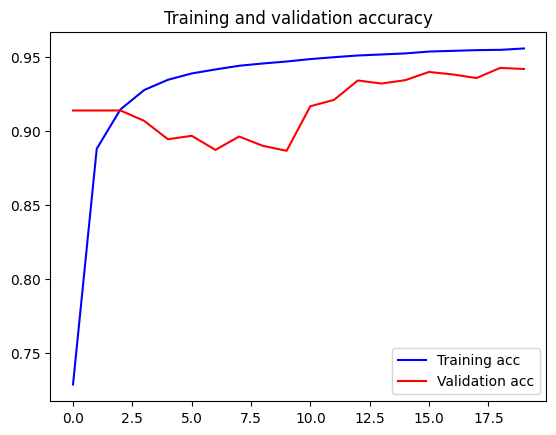

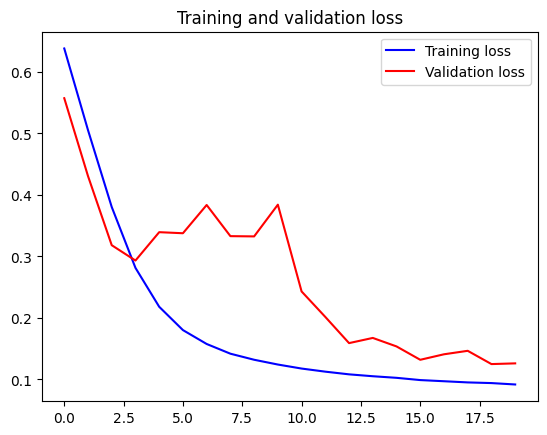

In [ ]:
metrics_plot(history_5)

In [ ]:
model_4.fit(train_generator,
            validation_data=val_generator,
            validation_steps=1,
            epochs=20,
            verbose=1)

Epoch 1/20
52/52 [==============================] - 30s 565ms/step - loss: 0.0903 - accuracy: 0.9560 - val_loss: 0.1167 - val_accuracy: 0.9455
Epoch 2/20
52/52 [==============================] - 30s 561ms/step - loss: 0.0881 - accuracy: 0.9570 - val_loss: 0.1153 - val_accuracy: 0.9453
Epoch 3/20
52/52 [==============================] - 31s 591ms/step - loss: 0.0856 - accuracy: 0.9578 - val_loss: 0.1077 - val_accuracy: 0.9474
Epoch 4/20
52/52 [==============================] - 31s 598ms/step - loss: 0.0854 - accuracy: 0.9578 - val_loss: 0.1159 - val_accuracy: 0.9457
Epoch 5/20
52/52 [==============================] - 30s 578ms/step - loss: 0.0841 - accuracy: 0.9582 - val_loss: 0.1193 - val_accuracy: 0.9430
Epoch 6/20
52/52 [==============================] - 29s 557ms/step - loss: 0.0830 - accuracy: 0.9584 - val_loss: 0.1094 - val_accuracy: 0.9465
Epoch 7/20
52/52 [==============================] - 30s 570ms/step - loss: 0.0832 - accuracy: 0.9582 - val_loss: 0.1133 - val_accuracy: 0.9460

1/1 [==============================] - 0s 45ms/step


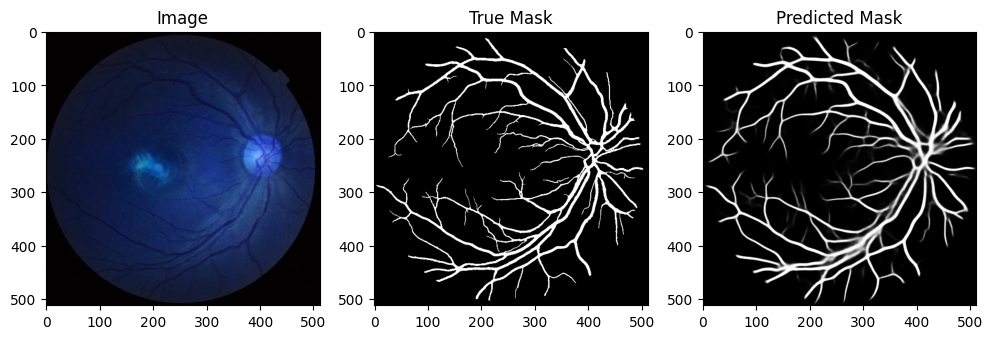

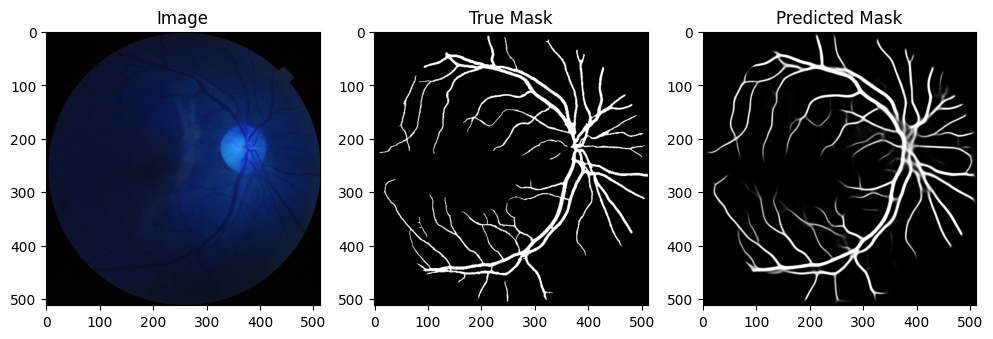

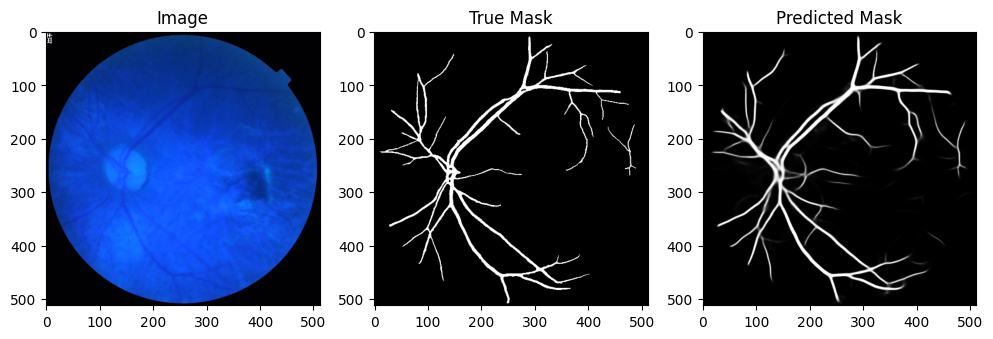

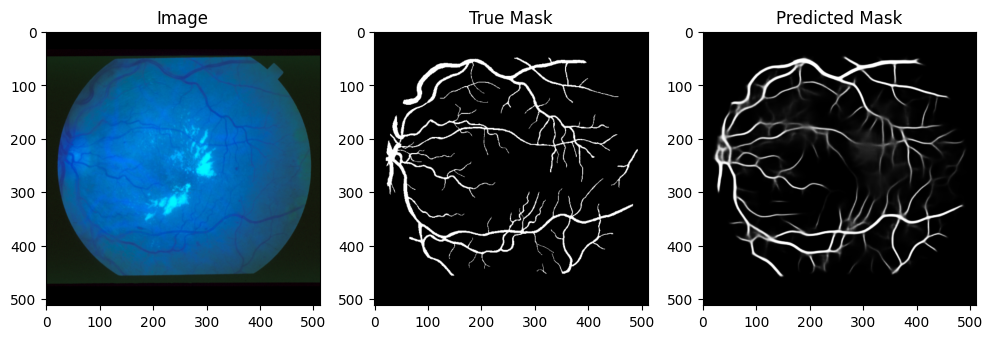

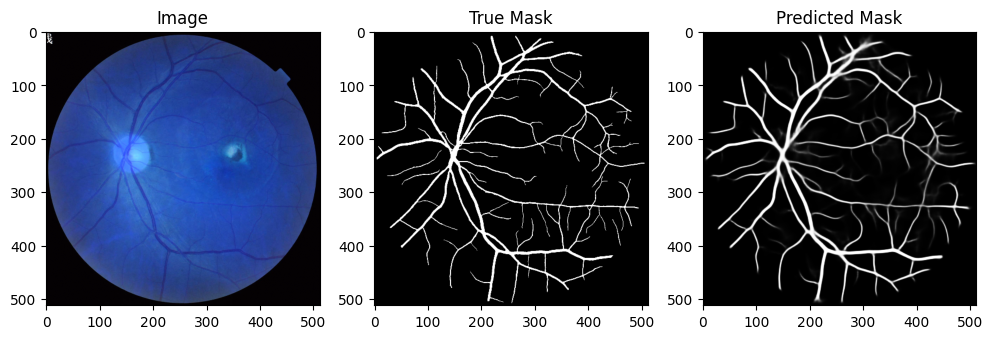

...

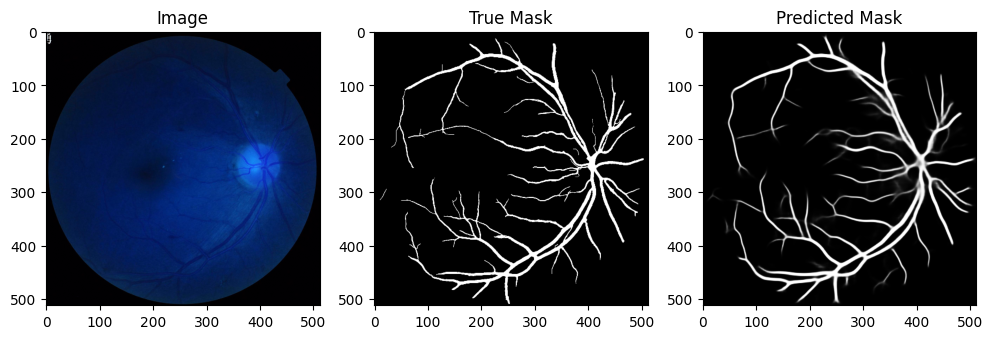

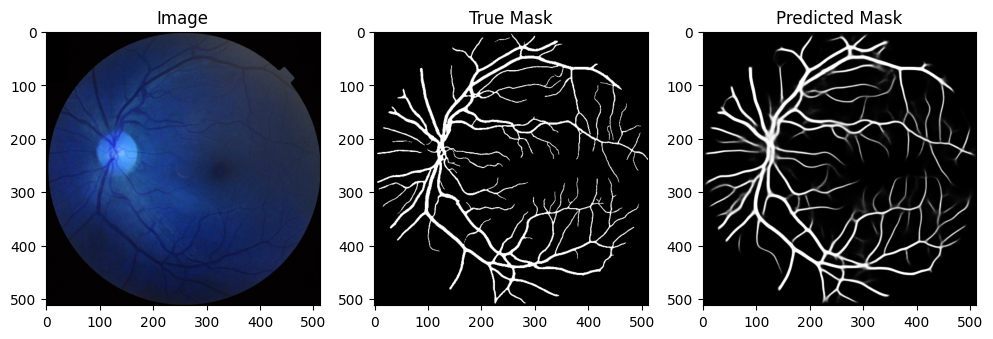

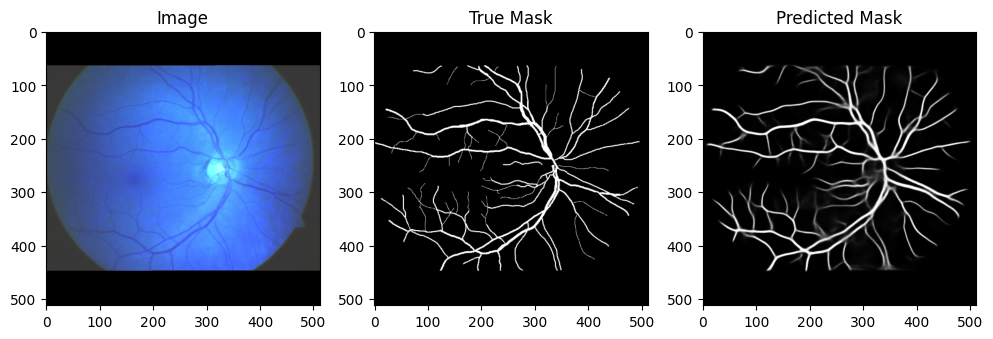

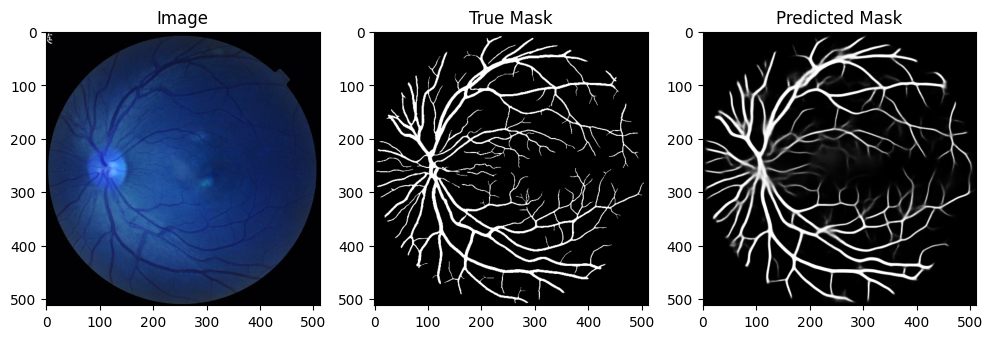

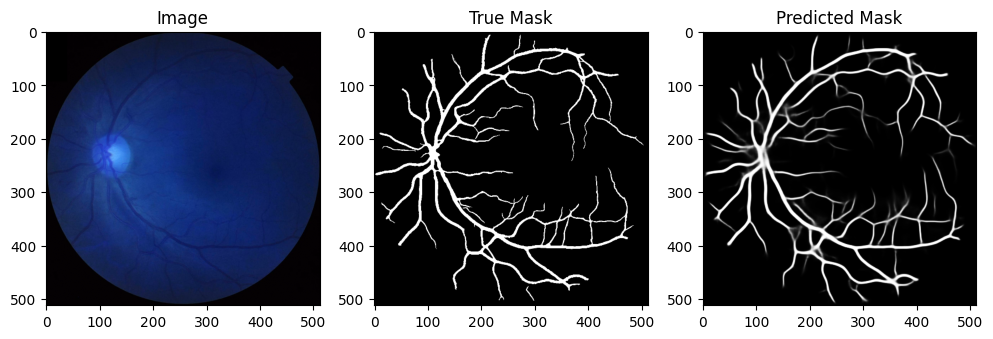

In [ ]:
predictions = model_4.predict(val_generator)

images, masks = next(iter(val_generator))
preds = model_4.predict(images)

for index in range(15):
  plt.figure(figsize=(12, 6))

  plt.subplot(1, 3, 1)
  plt.title('Image')
  plt.imshow(images[index])

  plt.subplot(1, 3, 2)
  plt.title('True Mask')
  plt.imshow(masks[index].squeeze(), cmap='gray')

  plt.subplot(1, 3, 3)
  plt.title('Predicted Mask')
  plt.imshow(preds[index].squeeze(), cmap='gray')

  plt.show()


In [ ]:
model_path = 'model_4.h5'

# Save the model
model_4.save(model_path)

print("Model saved successfully.")


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Model saved successfully.


In [ ]:
model_4.save("Fine_Tuned_SegNet_Model.keras")

In [ ]:
# Load the model

loaded_model_SEGNET = tf.keras.models.load_model("model_4.h5")
